In [112]:
import pandas as pd
data= pd.read_csv("sampled_df.csv")
data.head(10)

,title,year,director,actors,rating,runtime,genre,release_date,plot_summary,words_movies,headline,category,short_description,authors,date,words_news
0,The SpongeBob Movie: Sponge Out of Water,2015,"Directors:Paul Tibbitt, Mike Mitchell","Tom Kenny, Antonio Banderas, Bill Fagerbakke, ...",6.0,92,Animation,2/6/2015,When a diabolical pirate above the sea steals ...,diabolical pirate sea steals secret formula ne...,Fighting the New Stupidity,"Keith M. Parsons, ContributorPhilosopher, hist...",Vaccines are a great triumph of the human inte...,Vaccines are a great triumph of the human inte...,2/6/2015,Vaccines great triumph human intellect ancient...
1,Entourage,2015,Doug Ellin,"Adrian Grenier, Kevin Connolly, Jerry Ferrara,...",6.5,104,Comedy,7/18/2015,Film star Vince Chase navigates the vapid terr...,navigates vapid terrain close circle friends t...,Harper Lee's 'Watchmen' Infused With Religious...,"Cathy Lynn Grossman, Religion News Service",(RNS) Harper Lee’s “new” book “Go Set a Watchm...,(RNS) Harper Lee’s “new” book “Go Set a Watchm...,7/18/2015,new book Go infused religious life Christian m...
2,Baywatch,2017,Seth Gordon,"Dwayne Johnson, Zac Efron, Alexandra Daddario,...",5.5,116,Action,5/25/2017,Devoted lifeguard Mitch Buchannon butts heads ...,Devoted lifeguard butts heads brash new recrui...,39 Tweets That Capture How Much Parents Love Wine,Caroline Bologna,Happy National Wine Day!,Happy National Wine Day!,5/25/2017,Happy
3,Mute,2018,Duncan Jones,"Alexander Skarsgård, Paul Rudd, Justin Theroux...",5.4,126,Mystery,2/23/2018,A mute bartender goes up against his city's ga...,mute bartender goes city gangsters effort find...,"Despite Attacking Renewables, Trump Team Says ...",Chris D'Angelo,"""As long as it’s made in America, I’m good wit...","""As long as it’s made in America, I’m good wit...",2/23/2018,As long made ’m good said
4,Honeymoon,2014,Leigh Janiak,"Rose Leslie, Harry Treadaway, Ben Huber, Hanna...",5.7,87,Drama,9/12/2014,A newlywed couple finds their lake-country hon...,newlywed couple finds lake country honeymoon d...,"Golf Teacher Admits To Molesting Kids, Trying ...",Ed Mazza,NaN,NaN,9/12/2014,NaN
5,Split,2016,M. Night Shyamalan,"James McAvoy, Anya Taylor-Joy, Haley Lu Richar...",7.3,117 min,"Horror, Thriller",1/20/2017,Three girls are kidnapped by a man with a diag...,girls kidnapped man diagnosed distinct persona...,Newspaper Front Pages Usher In Uncertainty Of ...,Willa Frej,"""We have no idea what this guy's gonna do,"" on...","""We have no idea what this guy's gonna do,"" on...",1/20/2017,have idea guy gon do cover reads
6,Scooby-Doo! WrestleMania Mystery,2014,"Brandon Vietti, Seung-goo Jo, Young Won Jung, ...","Frank Welker, Mindy Cohn, Grey Griffin, Matthe...",7.4,84 min,"Animation, Comedy, Family, Mystery",3/25/2014,Shaggy and Scooby win tickets for a WWE City t...,win tickets trip go there attacked huge monste...,Gillian Georges: A Bar Star on the Rise,"Jose Martinez, Contributor\nJose Martinez is a...",Determined to eventually open her own restaura...,Determined to eventually open her own restaura...,3/25/2014,Determined eventually open own restaurant mayb...
7,Scooby-Doo! Music of the Vampire,2012,David Block,"Frank Welker, Matthew Lillard, Grey Griffin, M...",7.8,79 min,"Family, Animation, Mystery, Adventure, Comedy,...",3/13/2012,When Daphne becomes the star of a vampire film...,becomes star vampire film production thrown ch...,Do You Eat When You're Bored?,"Irene Rubaum-Keller, Contributor\nAuthor, Mili...","If you eat when you're bored, you are not alon...","If you eat when you're bored, you are not alon...",3/13/2012,eat bored alone Eating fun pleasure do procras...
8,The Rewrite,2014,Marc Lawrence,"Hugh Grant, Whit Baldwin, Vanessa Wasche",6.0,107 min,"Romance, Comedy",2/13/2015,An Oscar-winning writer in a slump leaves Holl...,Oscar winning writer slump leaves teach screen...,"Health Is Progress, Not Perfection","Erin Bahadur, Contributorrecovering addict, cr...","For me, health means much more

In [102]:
# Assuming your DataFrame is named 'data'
data = data[data['year'] != 2005]

In [103]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19988 entries, 0 to 19999
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   title              19988 non-null  object 
 1   year               19988 non-null  int64  
 2   director           19988 non-null  object 
 3   actors             19988 non-null  object 
 4   rating             19988 non-null  float64
 5   runtime            19988 non-null  object 
 6   genre              19988 non-null  object 
 7   release_date       19988 non-null  object 
 8   plot_summary       19988 non-null  object 
 9   words_movies       19988 non-null  object 
 10  headline           19988 non-null  object 
 11  category           16795 non-null  object 
 12  short_description  18416 non-null  object 
 13  authors            18338 non-null  object 
 14  date               19988 non-null  object 
 15  words_news         18274 non-null  object 
dtypes: float64(1), int64(1

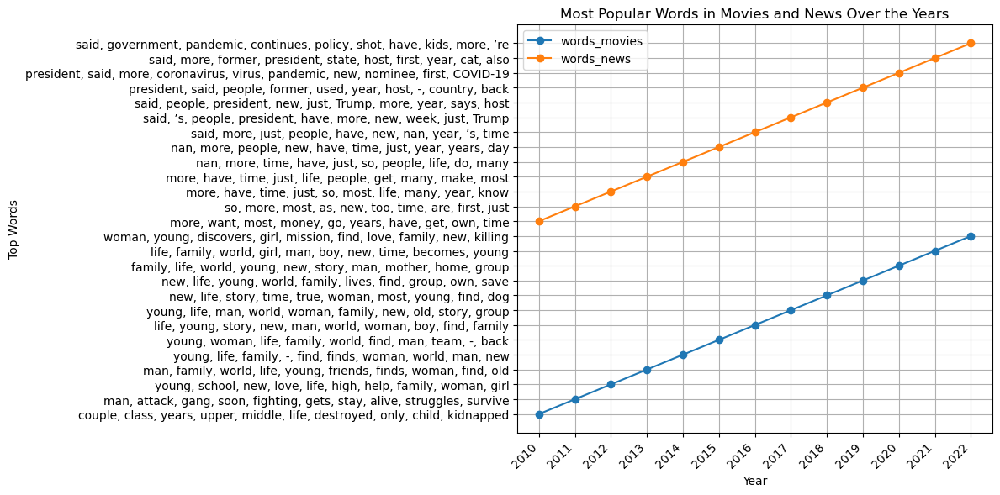

In [104]:
# Group the data by year
grouped_data = data.groupby('year')

# Create a dictionary to store the most popular words for each year
most_popular_words = {'year': [], 'words_movies': [], 'words_news': []}

# Iterate through each group (year) and find the most popular words
for year, group in grouped_data:
    words_movies = ' '.join(group['words_movies'])
    words_movies = words_movies.split()
    
    words_news = ' '.join(str(word) for word in group['words_news'])  # Convert non-string values to strings
    words_news = words_news.split()
    
    # Use Counter to count word frequencies
    movies_word_counts = Counter(words_movies)
    news_word_counts = Counter(words_news)
    
    # Get the most common words (adjust 'n' as needed)
    top_movies_words = [word for word, _ in movies_word_counts.most_common(10)]
    top_news_words = [word for word, _ in news_word_counts.most_common(10)]
    
    most_popular_words['year'].append(year)
    most_popular_words['words_movies'].append(', '.join(top_movies_words))
    most_popular_words['words_news'].append(', '.join(top_news_words))

# Create a new DataFrame for the most popular words
popular_words_df = pd.DataFrame(most_popular_words)

# Plot the most popular words over the years
plt.figure(figsize=(12, 6))
for col in ['words_movies', 'words_news']:
    plt.plot(popular_words_df['year'], popular_words_df[col], marker='o', label=col)

plt.xlabel('Year')
plt.ylabel('Top Words')
plt.title('Most Popular Words in Movies and News Over the Years')
plt.legend()

# Tilt the x-axis labels
plt.xticks(popular_words_df['year'], rotation=45, ha='right')

plt.grid(True)
plt.tight_layout()
plt.show()

In [105]:
# Group the data by year
grouped_data = data.groupby('year')

# Create a dictionary to store the most recurring genre words for each year
most_recurring_genre_words = {'year': [], 'common_genre_words': []}

# Define a function to extract and process genre words
def extract_and_process_genre_words(text):
    words = text.split()  # Split the genre text into individual words
    # Filter out common words that you consider noise (e.g., "and", "in")
    words = [word for word in words if word.lower() not in ['and', 'in', 'the', 'of']]
    return words

# Iterate through each group (year) and find the most recurring genre words
for year, group in grouped_data:
    genre_words = ' '.join(group['genre'])
    genre_words = extract_and_process_genre_words(genre_words)
    
    # Use Counter to count word frequencies
    genre_word_counts = Counter(genre_words)
    
    # Get the most common genre words (adjust 'n' as needed)
    top_genre_words = [word for word, _ in genre_word_counts.most_common(10)]
    
    most_recurring_genre_words['year'].append(year)
    most_recurring_genre_words['common_genre_words'].append(', '.join(top_genre_words))

# Create a new DataFrame for the most recurring genre words
recurring_genre_words_df = pd.DataFrame(most_recurring_genre_words)

# Print the results
print(recurring_genre_words_df)

    year                                 common_genre_words
0   2010  Animation,, Horror, Comedy, Fantasy,, Family,,...
1   2011  Horror,, Action,, Drama, Horror, Animation,, F...
2   2012  Action, Comedy, Drama, Crime, Adventure, Anima...
3   2013  Action, Comedy, Drama, Crime, Biography, Actio...
4   2014  Action, Comedy, Drama, Horror, Action,, Thrill...
5   2015  Action, Comedy, Drama, Biography, Comedy,, Adv...
6   2016  Action, Comedy, Drama, Action,, Drama,, Biogra...
7   2017  Drama, Action, Comedy, Action,, Animation,, Sc...
8   2018  Action, Drama, Action,, Comedy, Adventure,, Co...
9   2019  Action, Drama, Comedy, Action,, Thriller, Adve...
10  2020  Drama, Family,, Animation,, Comedy, Action, Fa...
11  2021  Action, Drama, Comedy,, Thriller, Animation,, ...
12  2022  Action, Drama, Thriller, Comedy, Action,, Anim...


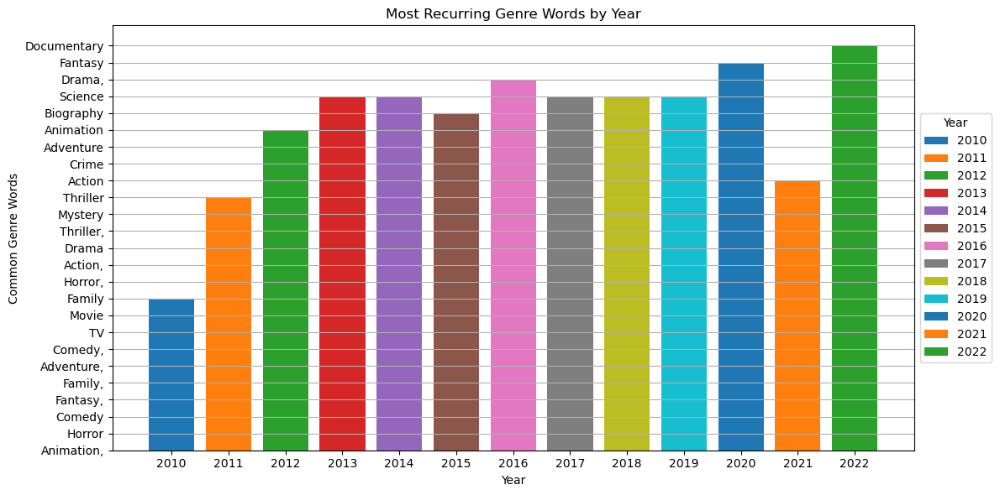

In [106]:
# Group the data by year
grouped_data = data.groupby('year')

# Create a dictionary to store the most recurring genre words for each year
most_recurring_genre_words = {'year': [], 'common_genre_words': []}

# Define a function to extract and process genre words
def extract_and_process_genre_words(text):
    words = text.split()  # Split the genre text into individual words
    # Filter out common words that you consider noise (e.g., "and", "in")
    words = [word for word in words if word.lower() not in ['and', 'in', 'the', 'of']]
    return words

# Iterate through each group (year) and find the most recurring genre words
for year, group in grouped_data:
    genre_words = ' '.join(group['genre'])
    genre_words = extract_and_process_genre_words(genre_words)
    
    # Use Counter to count word frequencies
    genre_word_counts = Counter(genre_words)
    
    # Get the most common genre words (adjust 'n' as needed)
    top_genre_words = [word for word, _ in genre_word_counts.most_common(10)]
    
    most_recurring_genre_words['year'].append(year)
    most_recurring_genre_words['common_genre_words'].append(', '.join(top_genre_words))

# Create a new DataFrame for the most recurring genre words
recurring_genre_words_df = pd.DataFrame(most_recurring_genre_words)

# Plot the most recurring genre words for each year
plt.figure(figsize=(12, 6))
for i, row in recurring_genre_words_df.iterrows():
    year = row['year']
    common_words = row['common_genre_words'].split(', ')
    plt.bar(year, common_words, label=str(year))

plt.xlabel('Year')
plt.ylabel('Common Genre Words')
plt.title('Most Recurring Genre Words by Year')
plt.legend(title='Year', loc='center left', bbox_to_anchor=(1, 0.5))
plt.xticks(recurring_genre_words_df['year'])
plt.grid(axis='y')
plt.tight_layout()

plt.show()

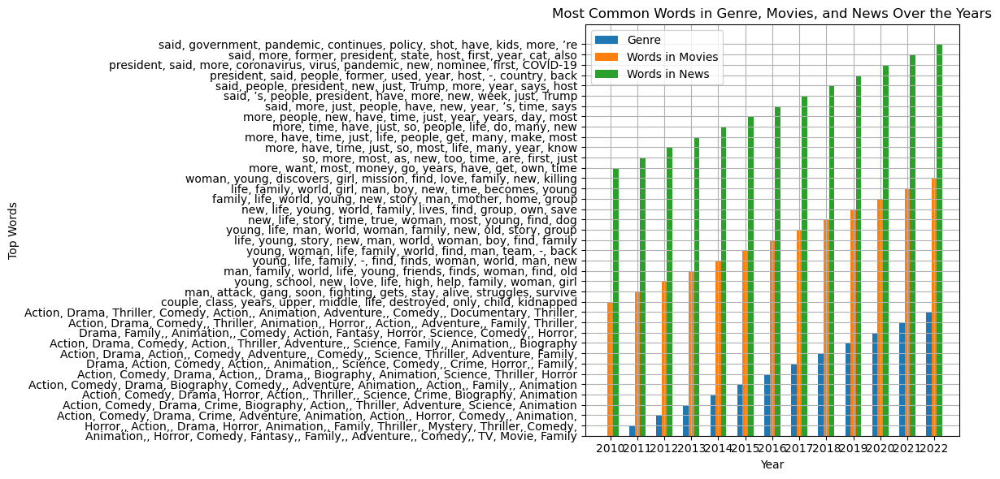

In [107]:
# Group the data by year
grouped_data = data.groupby('year')

# Create a dictionary to store the most common words for each year
most_common_words = {'year': [], 'genre': [], 'words_movies': [], 'words_news': []}

# Define a function to extract and process words
def extract_and_process_words(text, column_name):
    if pd.notna(text):  # Check if the value is not NaN
        if isinstance(text, str):
            words = text.split()  # Split the text into individual words
            # Filter out common words that you consider noise (e.g., "and", "in")
            words = [word for word in words if word.lower() not in ['and', 'in', 'the', 'of']]
            
            # Count the word frequencies
            word_counts = Counter(words)
            
            # Get the most common words (adjust 'n' as needed)
            top_words = [word for word, _ in word_counts.most_common(10)]
            
            most_common_words[column_name].append(', '.join(top_words))
        else:
            most_common_words[column_name].append(None)
    else:
        most_common_words[column_name].append(None)

# Iterate through each group (year) and find the most common words
for year, group in grouped_data:
    most_common_words['year'].append(year)
    
    extract_and_process_words(' '.join(group['genre']), 'genre')
    extract_and_process_words(' '.join(group['words_movies']), 'words_movies')
    
    # Handle non-string values in the "words_news" column
    words_news = ' '.join(str(word) if pd.notna(word) else '' for word in group['words_news'])
    extract_and_process_words(words_news, 'words_news')

# Create a new DataFrame for the most common words
common_words_df = pd.DataFrame(most_common_words)

# Plot the most common words year-wise
plt.figure(figsize=(12, 6))
x = common_words_df['year']
bar_width = 0.2

plt.bar(x - bar_width, common_words_df['genre'], bar_width, label='Genre')
plt.bar(x, common_words_df['words_movies'], bar_width, label='Words in Movies')
plt.bar(x + bar_width, common_words_df['words_news'], bar_width, label='Words in News')

plt.xlabel('Year')
plt.ylabel('Top Words')
plt.title('Most Common Words in Genre, Movies, and News Over the Years')
plt.legend()
plt.xticks(x)
plt.grid(True)
plt.tight_layout()
plt.show()

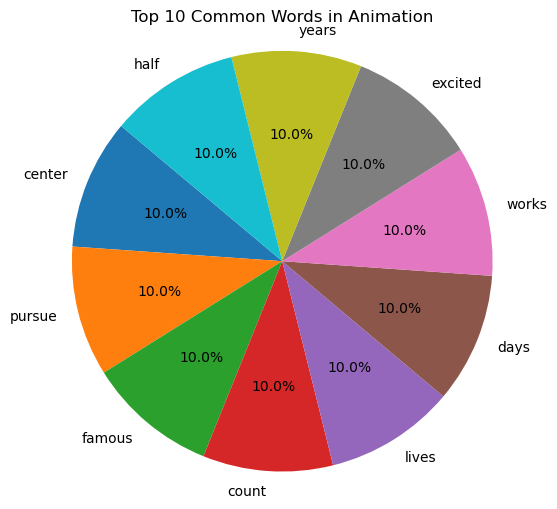

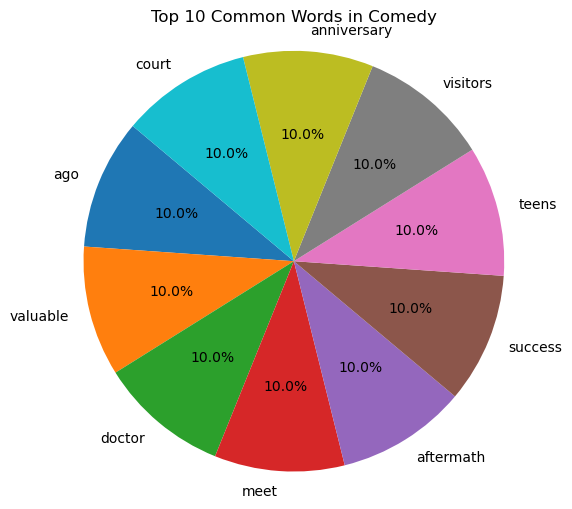

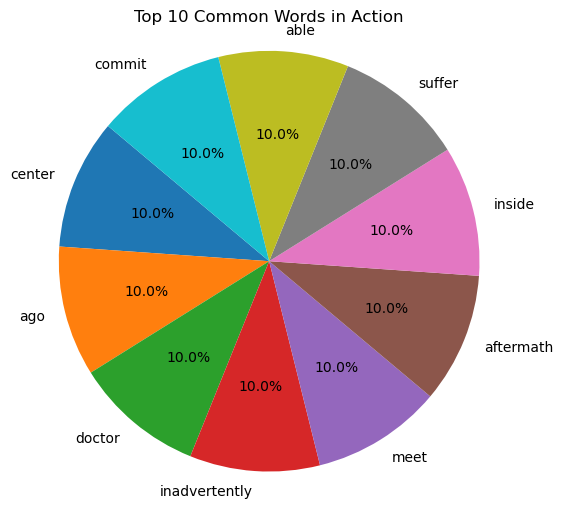

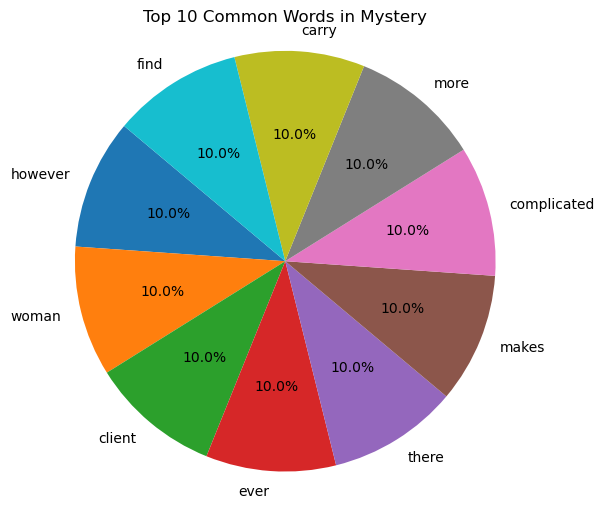

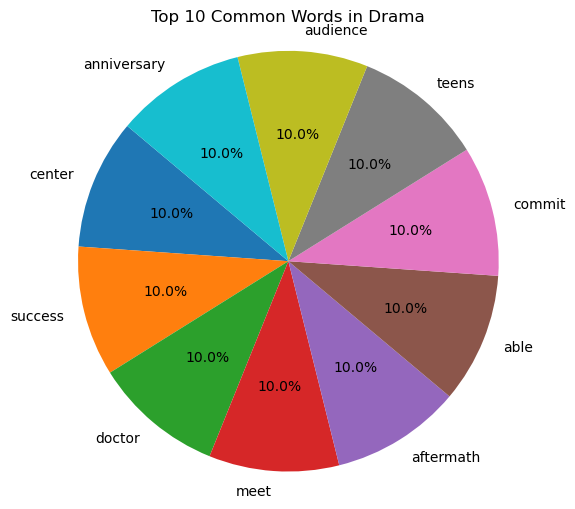

...

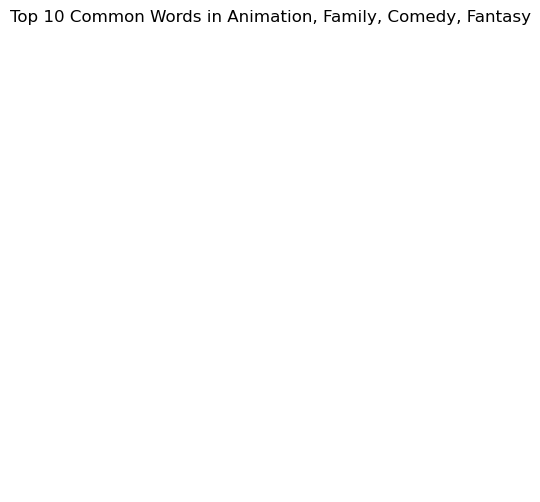

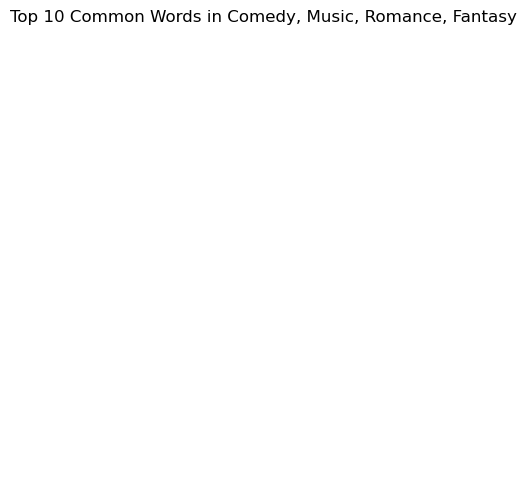

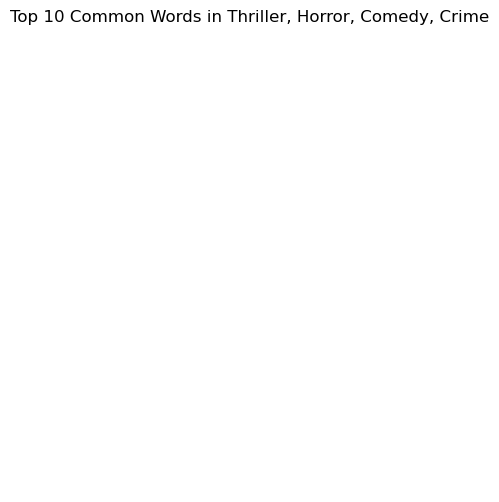

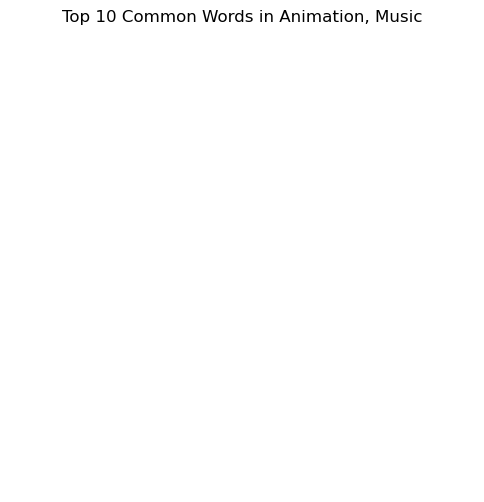

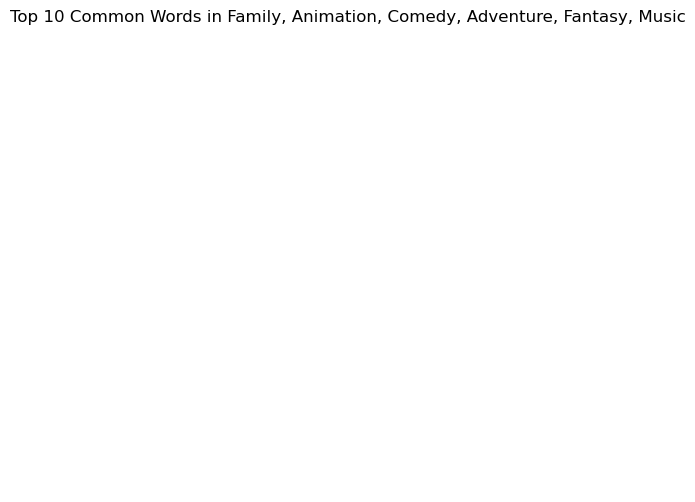

In [108]:
# Define a function to extract and process words
def extract_and_process_words(text):
    if pd.notna(text) and isinstance(text, str):  # Check if the value is not NaN and is a string
        words = text.split()  # Split the text into individual words
        # Filter out common words that you consider noise (e.g., "and", "in")
        words = [word for word in words if word.lower() not in ['and', 'in', 'the', 'of']]
        return words
    else:
        return []

# Create a dictionary to store word counts for each genre
word_counts_by_genre = {}

# Iterate through each genre and find common words
for genre in data['genre'].unique():
    genre_data = data[data['genre'] == genre]
    
    # Extract and process words from 'words_news' and 'words_movies'
    words_news = [word for desc in genre_data['words_news'] for word in extract_and_process_words(desc)]
    words_movies = [word for desc in genre_data['words_movies'] for word in extract_and_process_words(desc)]
    
    # Find common words
    common_words = list(set(words_news).intersection(words_movies))
    
    # Count the occurrences of common words
    word_counts = Counter(common_words)
    
    # Get the top 10 common words
    top_words = dict(word_counts.most_common(10))
    
    # Store the results by genre
    word_counts_by_genre[genre] = top_words

# Create a separate pie chart for each genre
for genre, top_words in word_counts_by_genre.items():
    labels = list(top_words.keys())
    sizes = list(top_words.values())
    
    plt.figure(figsize=(6, 6))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
    plt.axis('equal')
    plt.title(f'Top 10 Common Words in {genre}')
    plt.show()

In [109]:
pip install wordcloud


Note: you may need to restart the kernel to use updated packages.


IndexError: list index out of range

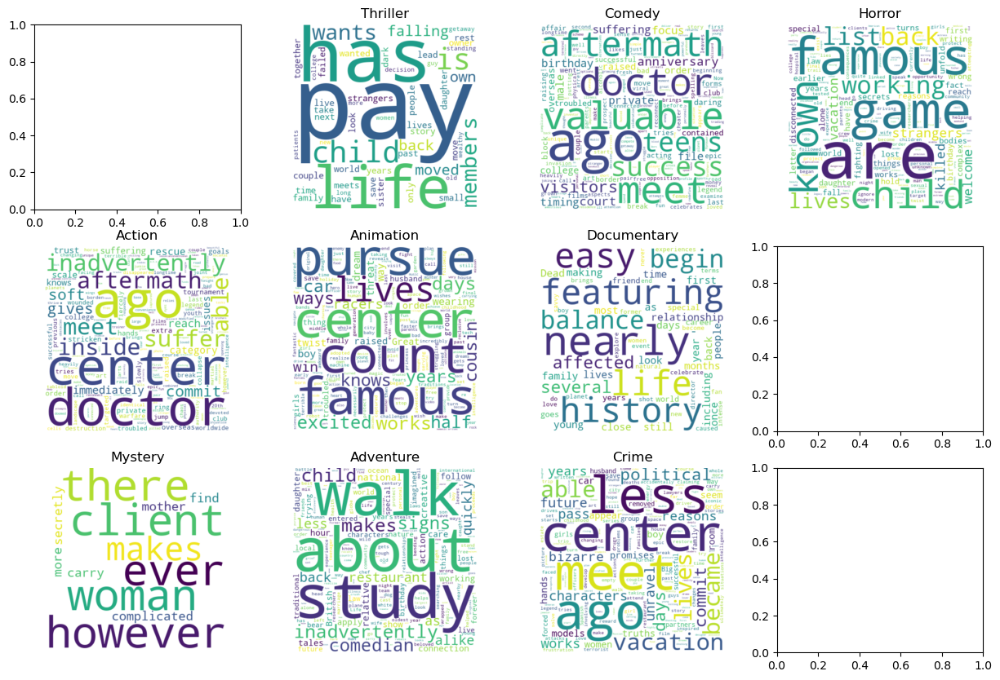

In [110]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter

# Define a function to extract and process words
def extract_and_process_words(text):
    if pd.notna(text) and isinstance(text, str):  # Check if the value is not NaN and is a string
        words = text.split()  # Split the text into individual words
        # Filter out common words that you consider noise (e.g., "and", "in")
        words = [word for word in words if word.lower() not in ['and', 'in', 'the', 'of']]
        return words
    else:
        return []

# Define the list of specified genres
specified_genres = ['Fiction', 'Thriller', 'Comedy', 'Horror', 'Action', 'Animation', 'Documentary', 'Sci-fi', 'Mystery', 'Adventure', 'Crime']

# Create a dictionary to store word counts for each genre
word_counts_by_genre = {genre: Counter() for genre in specified_genres}

# Iterate through each genre and find common words
for genre in specified_genres:
    genre_data = data[data['genre'] == genre]
    
    # Extract and process words from 'words_news' and 'words_movies'
    words_news = [word for desc in genre_data['words_news'] for word in extract_and_process_words(desc)]
    words_movies = [word for desc in genre_data['words_movies'] for word in extract_and_process_words(desc)]
    
    # Find common words
    common_words = list(set(words_news).intersection(words_movies))
    
    # Count the occurrences of common words
    word_counts = Counter(common_words)
    
    word_counts_by_genre[genre] = word_counts

# Create a word cloud matrix
num_genres = len(specified_genres)
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(15, 10))

for i, ax in enumerate(axes.flatten()):
    genre = specified_genres[i]
    common_words = word_counts_by_genre[genre]
    
    # Check if there are common words before generating a word cloud
    if common_words:
        # Generate a word cloud for the genre
        wordcloud = WordCloud(width=400, height=400, background_color='white').generate_from_frequencies(common_words)
    
        ax.imshow(wordcloud, interpolation='bilinear')
        ax.set_title(genre)
        ax.axis('off')

plt.tight_layout()
plt.show()


In [176]:
import pandas as pd

# Convert the 'release_date' column to a datetime object
data['release_date'] = pd.to_datetime(data['release_date'], format='%m/%d/%Y')

# Extract the month and create a new 'month' column in words
data['month'] = data['release_date'].dt.strftime('%B')

# Display the DataFrame with the new 'month' column in words
print(data[['release_date', 'month']])

      release_date      month
0       2015-02-06   February
1       2015-07-18       July
2       2017-05-25        May
3       2018-02-23   February
4       2014-09-12  September
...            ...        ...
19995   2018-08-31     August
19996   2017-10-24    October
19997   2016-11-04   November
19998   2018-03-29      March
19999   2013-05-23        May

[20000 rows x 2 columns]


C:\Users\asuri\AppData\Local\Temp\ipykernel_8620\2817383939.py:32: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  word_counts = pd.Series(Counter(combined_words))
C:\Users\asuri\AppData\Local\Temp\ipykernel_8620\2817383939.py:32: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  word_counts = pd.Series(Counter(combined_words))


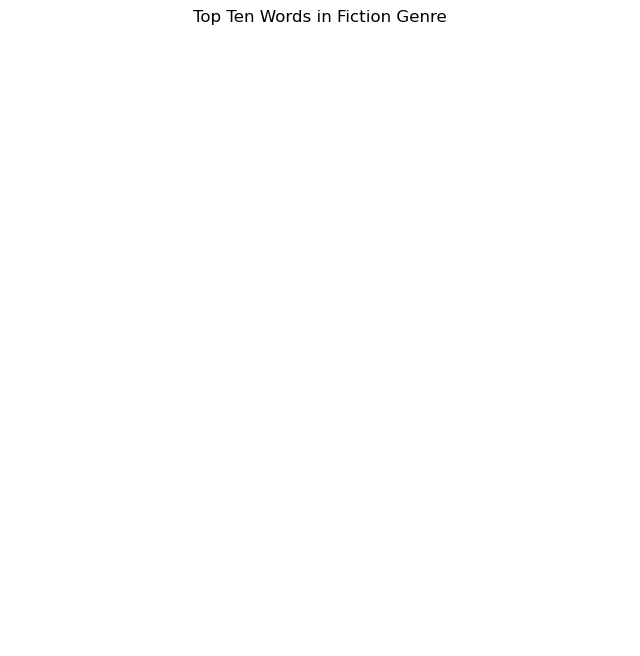

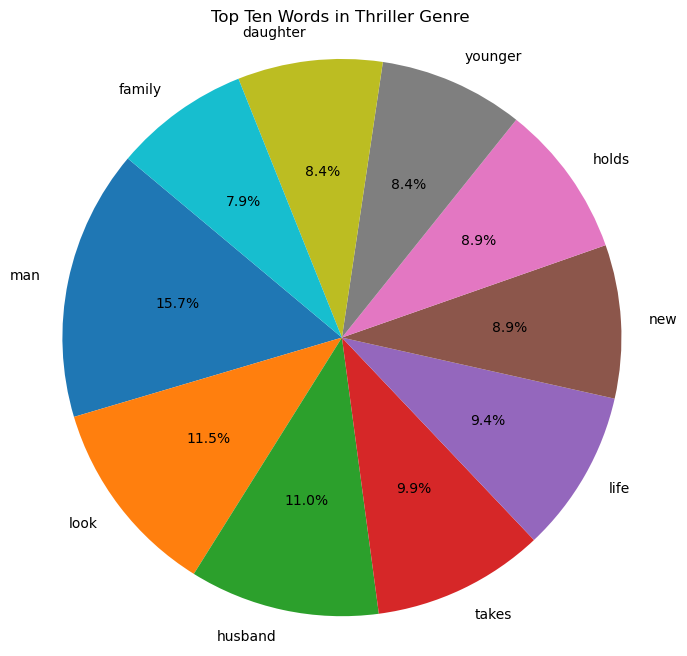

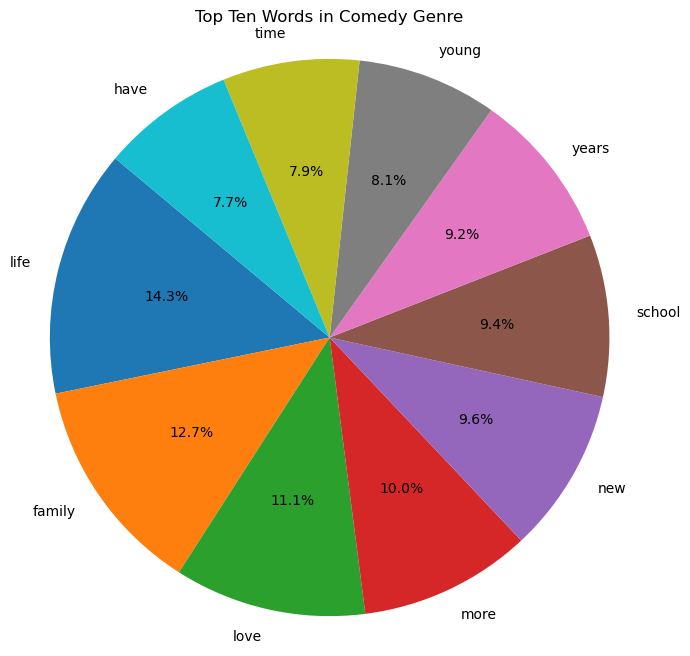

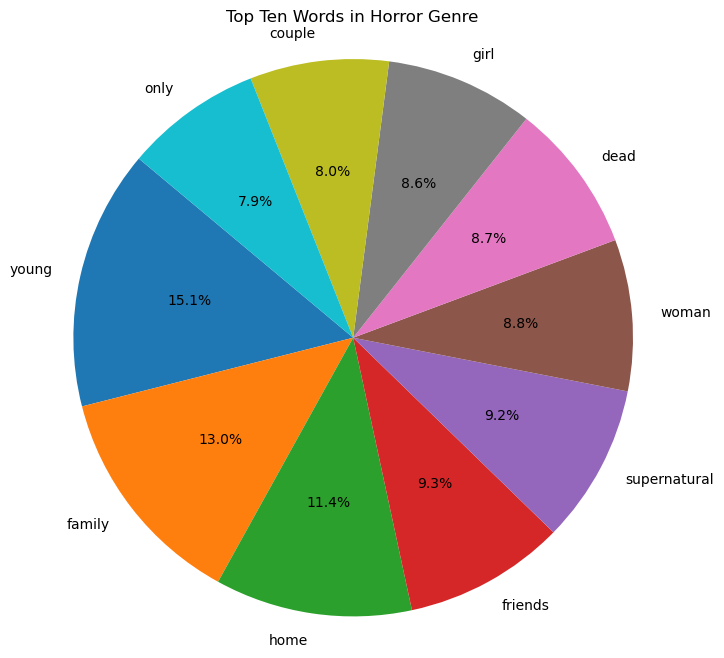

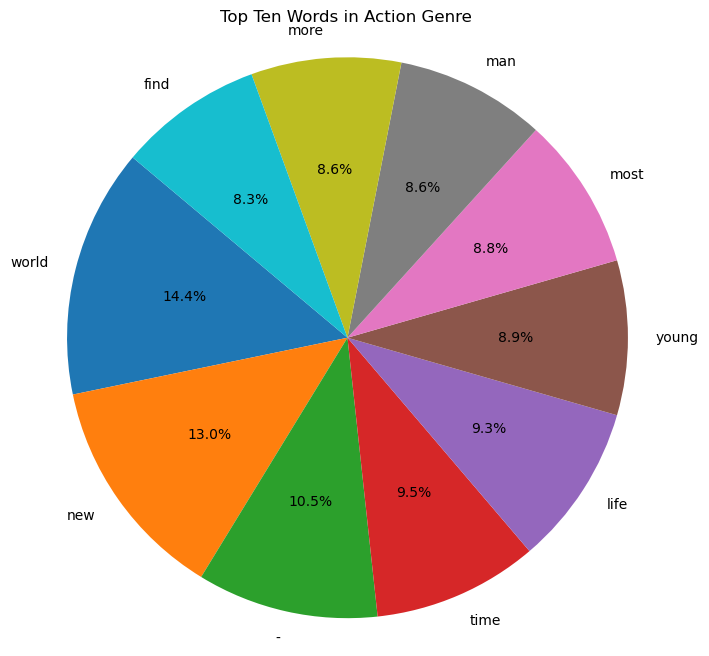

...

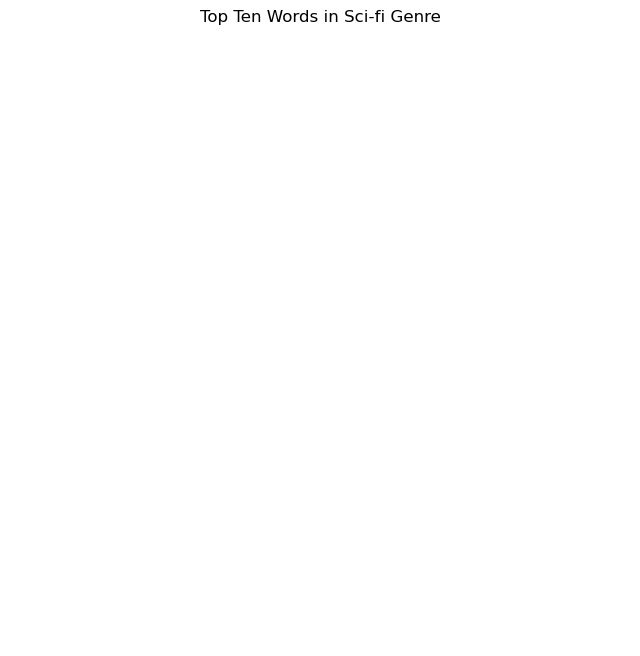

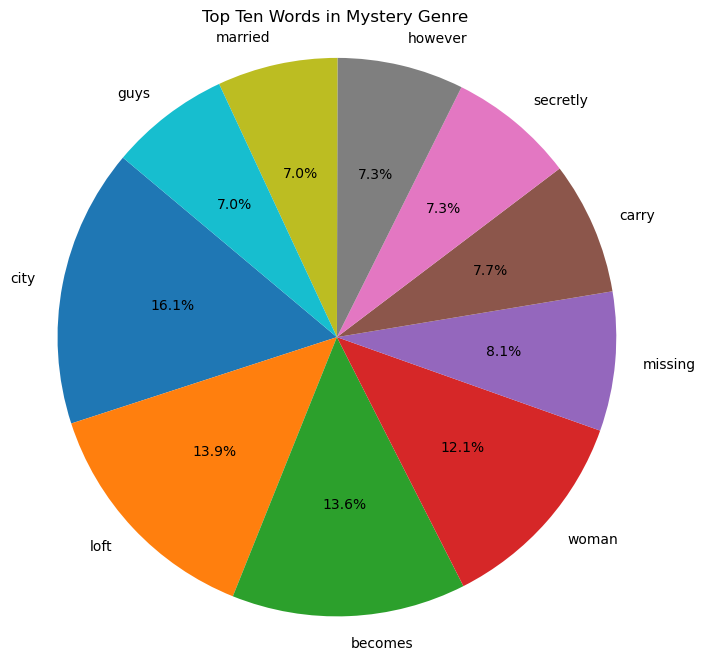

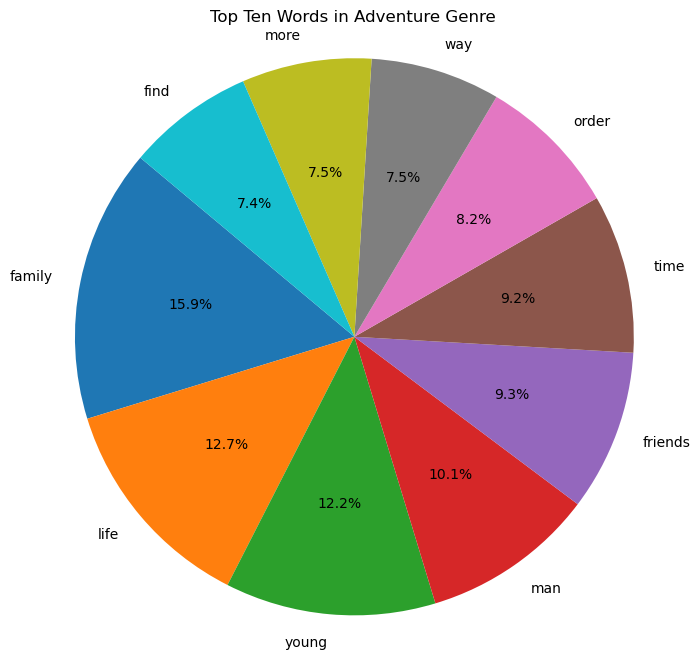

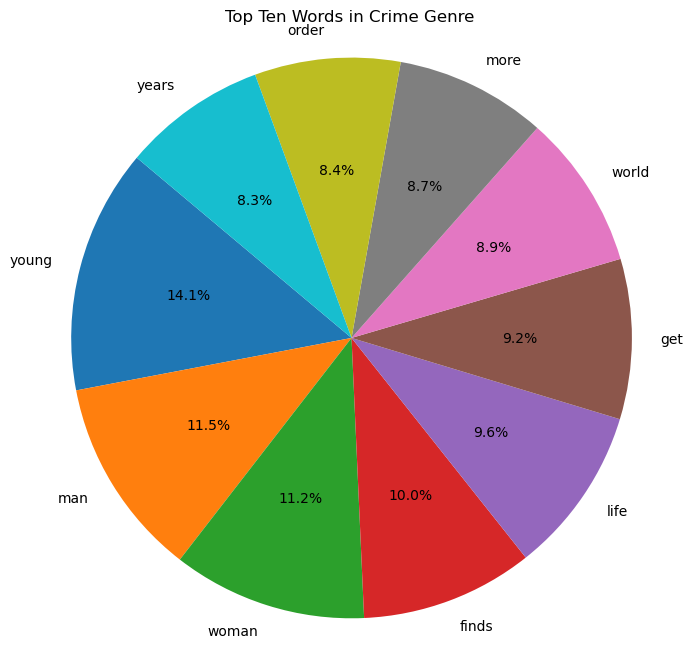

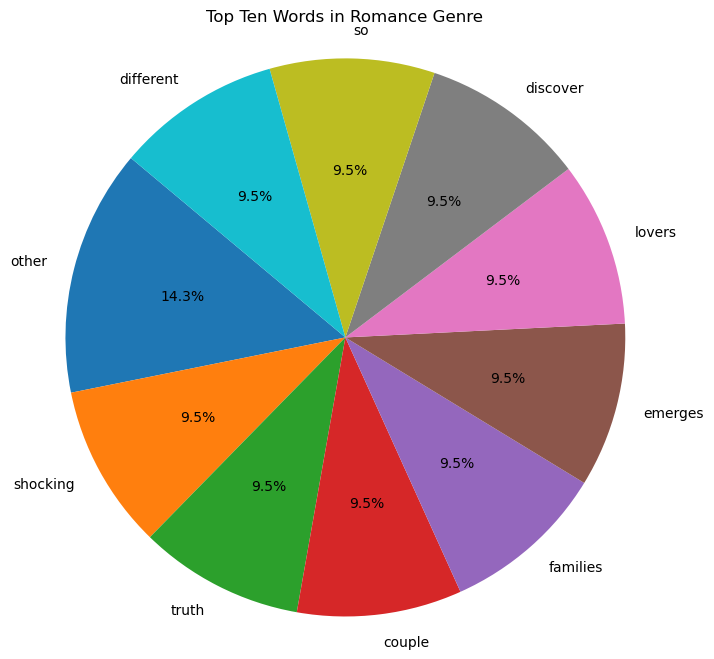

In [177]:
import pandas as pd
import matplotlib.pyplot as plt

# Define a function to extract and process words
def extract_and_process_words(text):
    if pd.notna(text) and isinstance(text, str):
        words = text.split()
        words = [word for word in words if word.lower() not in ['and', 'in', 'the', 'of']]
        return words
    else:
        return []

# Specify the genres you're interested in
genres_of_interest = ['Fiction', 'Thriller', 'Comedy', 'Horror', 'Action', 'Animation', 'Documentary', 'Sci-fi', 'Mystery', 'Adventure', 'Crime', 'Romance']

# Create a list to store data for each genre
genre_data = []

# Iterate through the genres
for genre in genres_of_interest:
    # Filter data for the specific genre
    genre_df = data[data['genre'] == genre]

    # Extract and process words from both 'words_movies' and 'words_news'
    words_movies = [word for desc in genre_df['words_movies'] for word in extract_and_process_words(desc)]
    words_news = [word for desc in genre_df['words_news'] for word in extract_and_process_words(desc)]

    # Combine words from both sources
    combined_words = words_movies + words_news

    # Count word occurrences
    word_counts = pd.Series(Counter(combined_words))

    # Get the top ten common words
    top_words = word_counts.nlargest(10)

    genre_data.append((genre, top_words))

# Create individual pie charts for each genre
for genre, top_words in genre_data:
    labels = top_words.index
    sizes = top_words.values
    plt.figure(figsize=(8, 8))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
    plt.axis('equal')
    plt.title(f'Top Ten Words in {genre} Genre')
    plt.show()


In [178]:
import pandas as pd

# Split 'data' into two DataFrames: df1 and df2
df1 = data[['words_movies', 'genre']].copy()
df2 = data[['words_movies', 'month']].copy()

# Process 'genre' column in df1 to keep only the first value
df1['genre'] = df1['genre'].str.split(',').str[0]

# Display the resulting DataFrames
print("df1:")
print(df1)

print("\ndf2:")
print(df2)


df1:
                                            words_movies      genre
0      diabolical pirate sea steals secret formula ne...  Animation
1      navigates vapid terrain close circle friends t...     Comedy
2      Devoted lifeguard butts heads brash new recrui...     Action
3      mute bartender goes city gangsters effort find...    Mystery
4      newlywed couple finds lake country honeymoon d...      Drama
...                                                  ...        ...
19995  small town menfolk live fear evil spirit named...     Comedy
19996  video artist looking work drives remote house ...      Crime
19997  served refuses kill people becomes first man A...  Biography
19998  creator virtual reality called dies makes post...     Action
19999  own kidnapped angry gangster track escaped pri...     Comedy

[20000 rows x 2 columns]

df2:
                                            words_movies      month
0      diabolical pirate sea steals secret formula ne...   February
1      navi

In [179]:
# Split the 'genre' column in df1 to keep only the first value
df1 = data[['words_movies', 'genre']].copy()
df1['genre'] = df1['genre'].str.split(',').str[0]

# Count the values in each genre
genre_counts = df1['genre'].value_counts()

# Display the counts
print("Genre Counts:")
print(genre_counts)

Genre Counts:
Action             5408
Drama              3427
Comedy             3402
Animation          1294
Horror             1228
Biography          1147
Crime              1011
Adventure           980
Thriller            519
Family              379
Science Fiction     286
Fantasy             205
Documentary         188
Romance             167
Mystery             110
War                  86
Music                57
TV Movie             39
Western              37
History              30
Name: genre, dtype: int64


In [180]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report

# Step 2: Text Vectorization with TF-IDF
tfidf_vectorizer = TfidfVectorizer()
X = tfidf_vectorizer.fit_transform(df1['words_movies'])

# Step 3: Normalization (not required for Naive Bayes)
# No need for normalization when using Multinomial Naive Bayes

# Step 4: Model Training
X_train, X_test, y_train, y_test = train_test_split(X, df1['genre'], test_size=0.2, random_state=42)

# Train the Naive Bayes classifier
classifier = MultinomialNB()
classifier.fit(X_train, y_train)

# Step 5: Model Evaluation
# Make predictions
y_pred = classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Generate a classification report
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)


Accuracy: 0.8965
Classification Report:
                  precision    recall  f1-score   support

         Action       0.83      0.99      0.90      1084
      Adventure       1.00      0.80      0.89       199
      Animation       0.99      0.87      0.92       256
      Biography       0.98      0.87      0.92       245
         Comedy       0.89      0.97      0.92       679
          Crime       0.98      0.90      0.94       210
    Documentary       1.00      0.67      0.81        43
          Drama       0.88      0.96      0.92       667
         Family       1.00      0.80      0.89        64
        Fantasy       1.00      0.39      0.56        49
        History       0.00      0.00      0.00         7
         Horror       0.96      0.92      0.94       234
          Music       1.00      0.10      0.18        10
        Mystery       1.00      0.43      0.60        21
        Romance       1.00      0.41      0.59        29
Science Fiction       1.00      0.48      0.65

C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


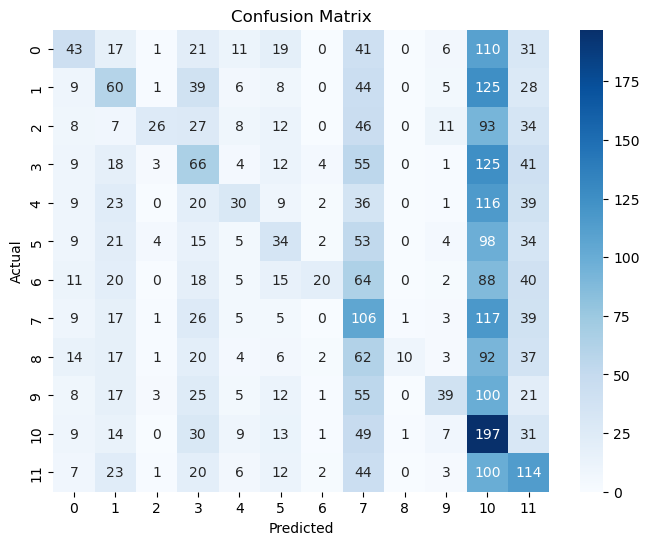

In [181]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a heatmap of the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


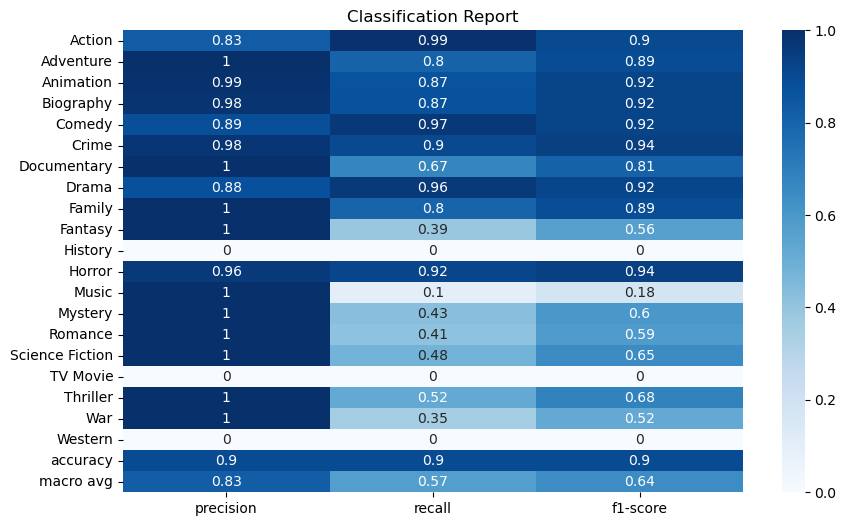

In [182]:
#pip install matplotlib seaborn
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize the classification report
report_dict = classification_report(y_test, y_pred, output_dict=True)
report_df = pd.DataFrame(report_dict).T
plt.figure(figsize=(10, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap="Blues")
plt.title("Classification Report")
plt.show()


In [187]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report

# Step 2: Text Vectorization with Count Vectorizer
count_vectorizer = CountVectorizer()
X = count_vectorizer.fit_transform(df1['words_movies'])

# Step 3: Model Training
X_train, X_test, y_train, y_test = train_test_split(X, df1['genre'], test_size=0.2, random_state=42)

# Train the Naive Bayes classifier
classifier = MultinomialNB()
classifier.fit(X_train, y_train)

# Step 4: Model Evaluation
# Make predictions
y_pred = classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Generate a classification report
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)


Accuracy: 0.95625
Classification Report:
                  precision    recall  f1-score   support

         Action       0.97      0.97      0.97      1084
      Adventure       0.96      0.93      0.95       199
      Animation       0.94      0.96      0.95       256
      Biography       0.93      0.96      0.94       245
         Comedy       0.95      0.96      0.96       679
          Crime       0.97      0.95      0.96       210
    Documentary       0.95      0.95      0.95        43
          Drama       0.97      0.97      0.97       667
         Family       0.91      0.95      0.93        64
        Fantasy       0.98      0.96      0.97        49
        History       0.67      0.29      0.40         7
         Horror       0.95      0.96      0.95       234
          Music       0.89      0.80      0.84        10
        Mystery       1.00      0.90      0.95        21
        Romance       0.82      0.79      0.81        29
Science Fiction       0.98      0.89      0.9

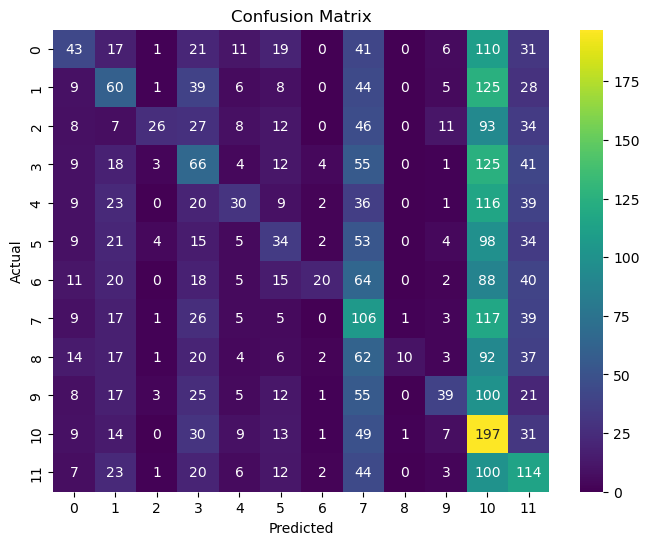

In [188]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a heatmap of the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="viridis")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

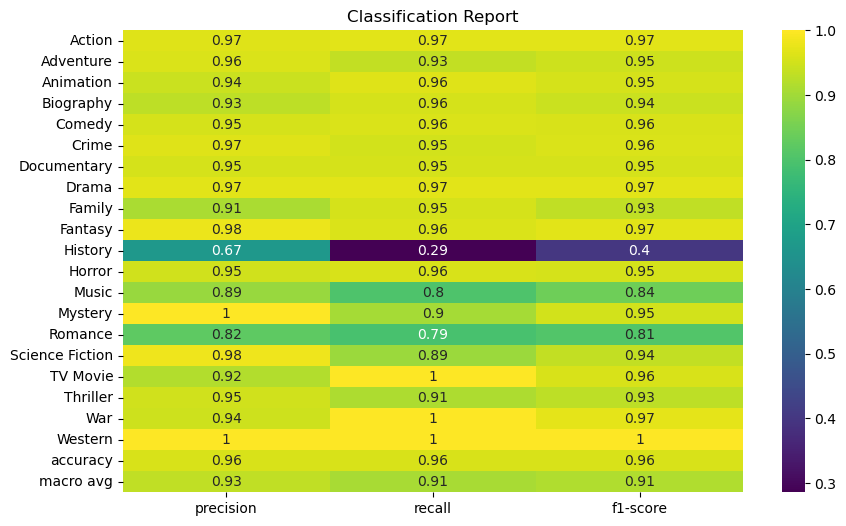

In [189]:
#pip install matplotlib seaborn
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize the classification report
report_dict = classification_report(y_test, y_pred, output_dict=True)
report_df = pd.DataFrame(report_dict).T
plt.figure(figsize=(10, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap="viridis")
plt.title("Classification Report")
plt.show()

In [196]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report

# Step 2: Text Vectorization with TF-IDF
tfidf_vectorizer = TfidfVectorizer()
X = tfidf_vectorizer.fit_transform(df2['words_movies'])

# Step 3: Normalization (not required for Naive Bayes)
# No need for normalization when using Multinomial Naive Bayes

# Step 4: Model Training
X_train, X_test, y_train, y_test = train_test_split(X, df2['month'], test_size=0.2, random_state=42)

# Train the Naive Bayes classifier
classifier = MultinomialNB()
classifier.fit(X_train, y_train)

# Step 5: Model Evaluation
# Make predictions
y_pred = classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Generate a classification report
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)

Accuracy: 0.947
Classification Report:
               precision    recall  f1-score   support

       April       0.95      0.96      0.95       347
      August       0.94      0.94      0.94       354
    December       0.96      0.90      0.93       277
    February       0.96      0.98      0.97       350
     January       0.96      0.94      0.95       345
        July       0.96      0.94      0.95       342
        June       0.95      0.94      0.95       308
       March       0.93      0.97      0.95       341
         May       0.99      0.91      0.95       267
    November       0.97      0.95      0.96       301
     October       0.89      0.95      0.92       410
   September       0.94      0.96      0.95       358

    accuracy                           0.95      4000
   macro avg       0.95      0.95      0.95      4000
weighted avg       0.95      0.95      0.95      4000



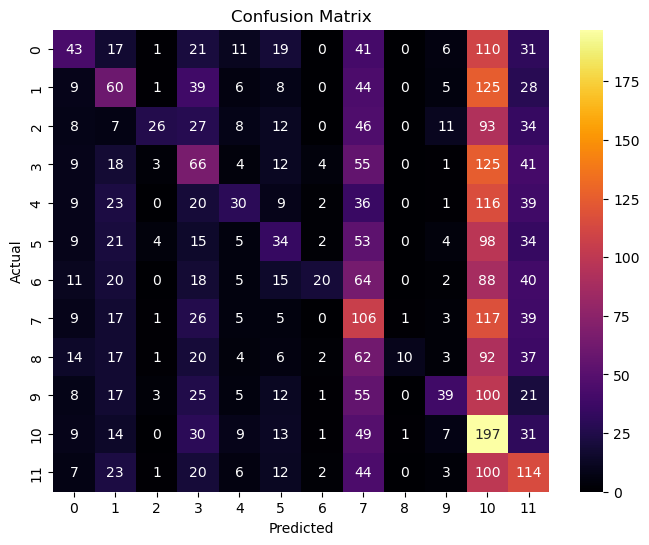

In [197]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a heatmap of the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="inferno")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

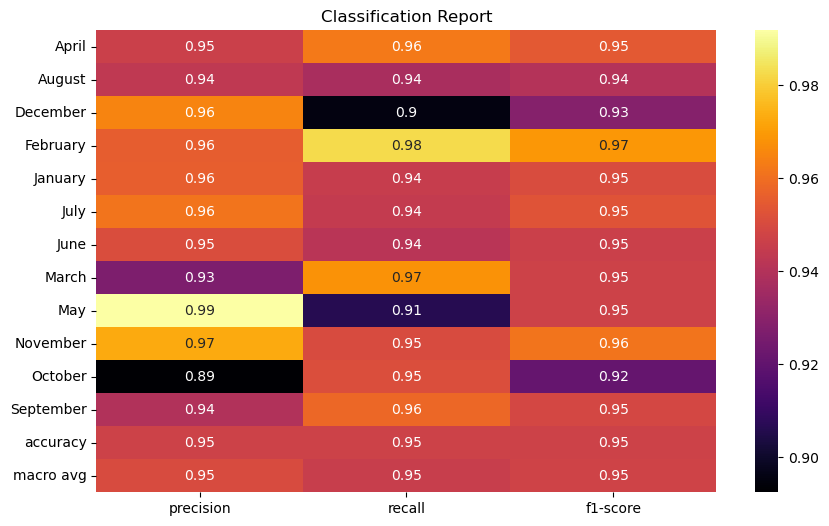

In [198]:
#pip install matplotlib seaborn
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize the classification report
report_dict = classification_report(y_test, y_pred, output_dict=True)
report_df = pd.DataFrame(report_dict).T
plt.figure(figsize=(10, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap="inferno")
plt.title("Classification Report")
plt.show()

In [190]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report

# Step 2: Text Vectorization with Count Vectorizer
count_vectorizer = CountVectorizer()
X = count_vectorizer.fit_transform(df2['words_movies'])

# Step 3: Model Training
X_train, X_test, y_train, y_test = train_test_split(X, df2['month'], test_size=0.2, random_state=42)

# Train the Naive Bayes classifier
classifier = MultinomialNB()
classifier.fit(X_train, y_train)

# Step 4: Model Evaluation
# Make predictions
y_pred = classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Generate a classification report
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)


Accuracy: 0.949
Classification Report:
               precision    recall  f1-score   support

       April       0.94      0.96      0.95       347
      August       0.95      0.94      0.94       354
    December       0.93      0.92      0.93       277
    February       0.95      0.97      0.96       350
     January       0.96      0.95      0.96       345
        July       0.95      0.94      0.95       342
        June       0.94      0.95      0.95       308
       March       0.94      0.96      0.95       341
         May       0.97      0.95      0.96       267
    November       0.95      0.95      0.95       301
     October       0.94      0.95      0.94       410
   September       0.96      0.95      0.95       358

    accuracy                           0.95      4000
   macro avg       0.95      0.95      0.95      4000
weighted avg       0.95      0.95      0.95      4000



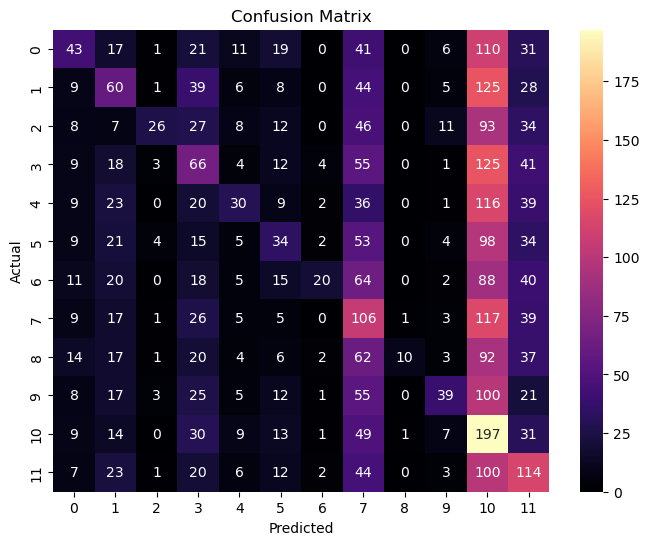

In [191]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a heatmap of the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="magma")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

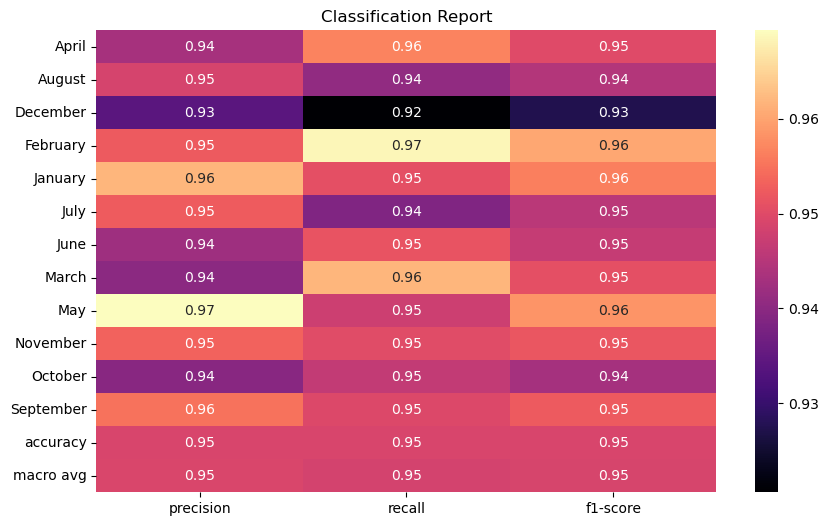

In [192]:
#pip install matplotlib seaborn
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize the classification report
report_dict = classification_report(y_test, y_pred, output_dict=True)
report_df = pd.DataFrame(report_dict).T
plt.figure(figsize=(10, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap="magma")
plt.title("Classification Report")
plt.show()

In [199]:
df3 = data[['words_news', 'month']].copy()
df3.dropna(subset=['words_news'], inplace=True)

df4 = data[['words_news', 'genre']].copy()
df4.dropna(subset=['words_news'], inplace=True)

# Process 'genre' column in df1 to keep only the first value
df4['genre'] = df4['genre'].str.split(',').str[0]

In [200]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report

# Step 2: Text Vectorization with TF-IDF
tfidf_vectorizer = TfidfVectorizer()
X = tfidf_vectorizer.fit_transform(df3['words_news'])

# Step 3: Normalization (not required for Naive Bayes)
# No need for normalization when using Multinomial Naive Bayes

# Step 4: Model Training
X_train, X_test, y_train, y_test = train_test_split(X, df3['month'], test_size=0.2, random_state=42)

# Train the Naive Bayes classifier
classifier = MultinomialNB()
classifier.fit(X_train, y_train)

# Step 5: Model Evaluation
# Make predictions
y_pred = classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Generate a classification report
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)

Accuracy: 0.20366320393657736
Classification Report:
               precision    recall  f1-score   support

       April       0.30      0.14      0.19       300
      August       0.24      0.18      0.21       325
    December       0.63      0.10      0.17       272
    February       0.20      0.20      0.20       338
     January       0.31      0.11      0.16       285
        July       0.22      0.12      0.16       279
        June       0.59      0.07      0.13       283
       March       0.16      0.32      0.22       329
         May       0.83      0.04      0.07       268
    November       0.46      0.14      0.21       286
     October       0.14      0.55      0.23       361
   September       0.23      0.34      0.28       332

    accuracy                           0.20      3658
   macro avg       0.36      0.19      0.18      3658
weighted avg       0.34      0.20      0.19      3658



In [201]:
from sklearn.metrics import confusion_matrix

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Display the confusion matrix
print("Confusion Matrix:")
print(conf_matrix)


Confusion Matrix:
[[ 43  17   1  21  11  19   0  41   0   6 110  31]
 [  9  60   1  39   6   8   0  44   0   5 125  28]
 [  8   7  26  27   8  12   0  46   0  11  93  34]
 [  9  18   3  66   4  12   4  55   0   1 125  41]
 [  9  23   0  20  30   9   2  36   0   1 116  39]
 [  9  21   4  15   5  34   2  53   0   4  98  34]
 [ 11  20   0  18   5  15  20  64   0   2  88  40]
 [  9  17   1  26   5   5   0 106   1   3 117  39]
 [ 14  17   1  20   4   6   2  62  10   3  92  37]
 [  8  17   3  25   5  12   1  55   0  39 100  21]
 [  9  14   0  30   9  13   1  49   1   7 197  31]
 [  7  23   1  20   6  12   2  44   0   3 100 114]]


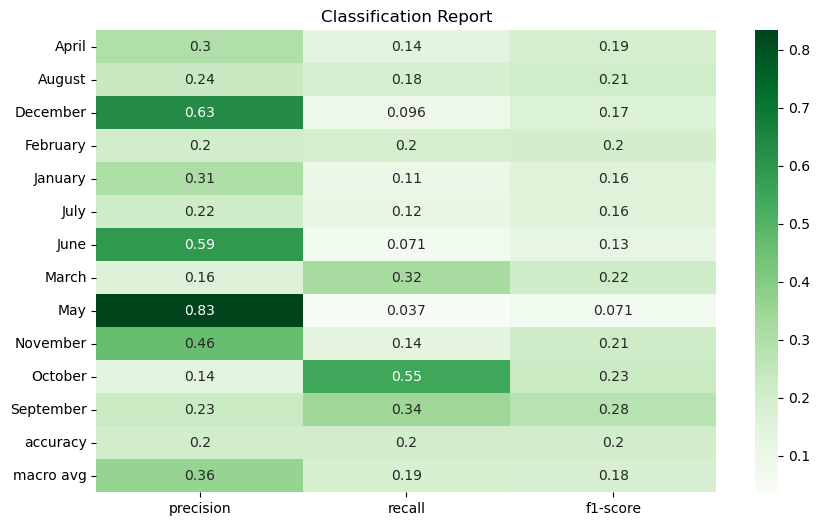

In [202]:
#pip install matplotlib seaborn
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize the classification report
report_dict = classification_report(y_test, y_pred, output_dict=True)
report_df = pd.DataFrame(report_dict).T
plt.figure(figsize=(10, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap="Greens")
plt.title("Classification Report")
plt.show()

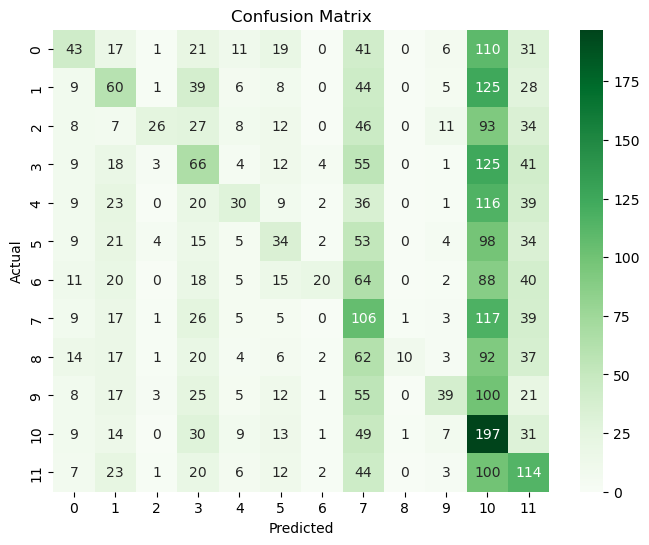

In [203]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a heatmap of the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


In [204]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report

# Step 2: Text Vectorization with Count Vectorizer
count_vectorizer = CountVectorizer()
X = count_vectorizer.fit_transform(df3['words_news'])

# Step 3: Model Training
X_train, X_test, y_train, y_test = train_test_split(X, df3['month'], test_size=0.2, random_state=42)

# Train the Naive Bayes classifier
classifier = MultinomialNB()
classifier.fit(X_train, y_train)

# Step 4: Model Evaluation
# Make predictions
y_pred = classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Generate a classification report
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)


Accuracy: 0.21733187534171677
Classification Report:
               precision    recall  f1-score   support

       April       0.26      0.22      0.24       300
      August       0.20      0.20      0.20       325
    December       0.34      0.17      0.22       272
    February       0.19      0.24      0.21       338
     January       0.20      0.14      0.16       285
        July       0.20      0.17      0.18       279
        June       0.30      0.16      0.20       283
       March       0.19      0.28      0.23       329
         May       0.31      0.12      0.17       268
    November       0.26      0.18      0.21       286
     October       0.17      0.34      0.23       361
   September       0.24      0.33      0.28       332

    accuracy                           0.22      3658
   macro avg       0.24      0.21      0.21      3658
weighted avg       0.23      0.22      0.21      3658



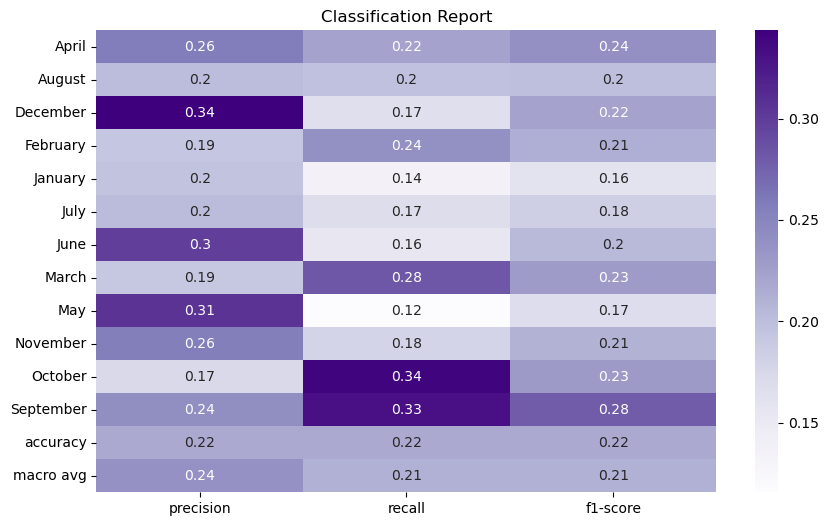

In [205]:
#pip install matplotlib seaborn
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize the classification report
report_dict = classification_report(y_test, y_pred, output_dict=True)
report_df = pd.DataFrame(report_dict).T
plt.figure(figsize=(10, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap="Purples")
plt.title("Classification Report")
plt.show()

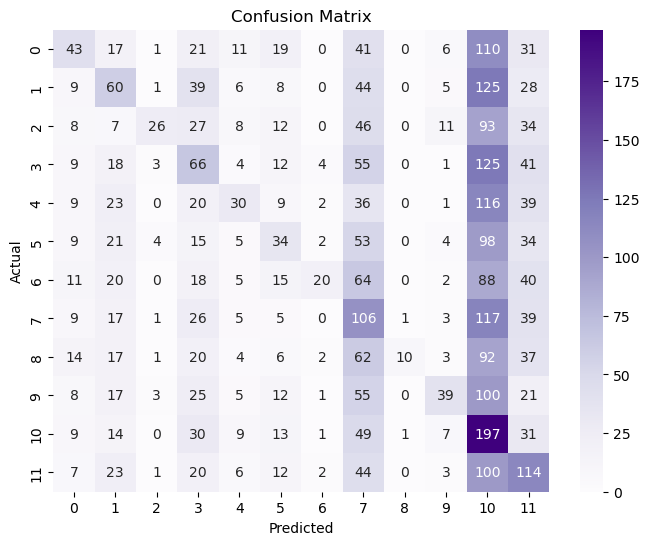

In [206]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a heatmap of the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Purples")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [207]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report

# Step 2: Text Vectorization with TF-IDF
tfidf_vectorizer = TfidfVectorizer()
X = tfidf_vectorizer.fit_transform(df4['words_news'])

# Step 3: Normalization (not required for Naive Bayes)
# No need for normalization when using Multinomial Naive Bayes

# Step 4: Model Training
X_train, X_test, y_train, y_test = train_test_split(X, df4['genre'], test_size=0.2, random_state=42)

# Train the Naive Bayes classifier
classifier = MultinomialNB()
classifier.fit(X_train, y_train)

# Step 5: Model Evaluation
# Make predictions
y_pred = classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Generate a classification report
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)

Accuracy: 0.2736468015308912
Classification Report:
                  precision    recall  f1-score   support

         Action       0.28      0.94      0.43      1024
      Adventure       0.00      0.00      0.00       196
      Animation       0.00      0.00      0.00       223
      Biography       0.00      0.00      0.00       214
         Comedy       0.17      0.03      0.05       607
          Crime       0.00      0.00      0.00       184
    Documentary       0.00      0.00      0.00        30
          Drama       0.15      0.03      0.05       615
         Family       0.00      0.00      0.00        75
        Fantasy       0.00      0.00      0.00        36
        History       0.00      0.00      0.00         4
         Horror       0.00      0.00      0.00       202
          Music       0.00      0.00      0.00        11
        Mystery       0.00      0.00      0.00        23
        Romance       0.00      0.00      0.00        31
Science Fiction       0.00      0.

C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


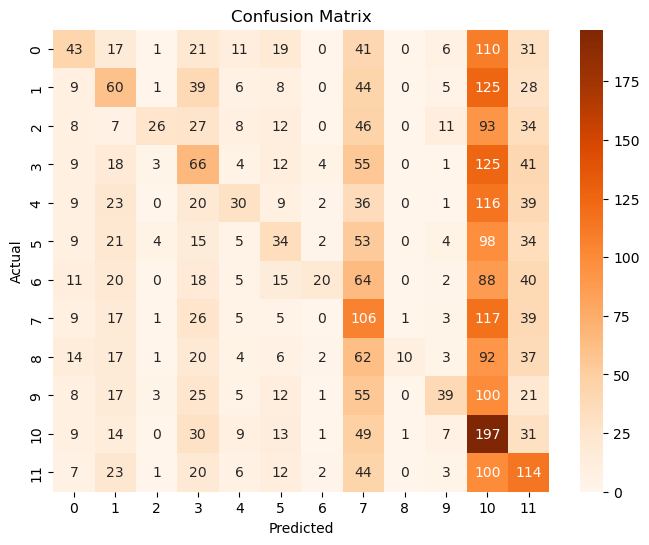

In [208]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a heatmap of the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Oranges")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


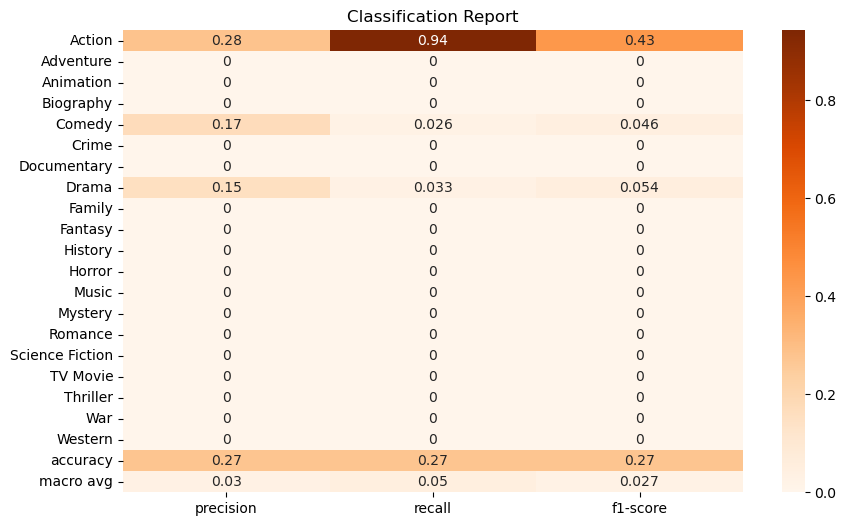

In [209]:
#pip install matplotlib seaborn
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize the classification report
report_dict = classification_report(y_test, y_pred, output_dict=True)
report_df = pd.DataFrame(report_dict).T
plt.figure(figsize=(10, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap="Oranges")
plt.title("Classification Report")
plt.show()

In [210]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report

# Step 2: Text Vectorization with Count Vectorizer
count_vectorizer = CountVectorizer()
X = count_vectorizer.fit_transform(df4['words_news'])

# Step 3: Model Training
X_train, X_test, y_train, y_test = train_test_split(X, df4['genre'], test_size=0.2, random_state=42)

# Train the Naive Bayes classifier
classifier = MultinomialNB()
classifier.fit(X_train, y_train)

# Step 4: Model Evaluation
# Make predictions
y_pred = classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Generate a classification report
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)


Accuracy: 0.23482777474029523
Classification Report:
                  precision    recall  f1-score   support

         Action       0.28      0.64      0.39      1024
      Adventure       0.05      0.01      0.01       196
      Animation       0.03      0.00      0.01       223
      Biography       0.03      0.00      0.01       214
         Comedy       0.16      0.16      0.16       607
          Crime       0.03      0.01      0.01       184
    Documentary       0.00      0.00      0.00        30
          Drama       0.18      0.16      0.17       615
         Family       0.00      0.00      0.00        75
        Fantasy       0.00      0.00      0.00        36
        History       0.00      0.00      0.00         4
         Horror       0.13      0.02      0.03       202
          Music       0.00      0.00      0.00        11
        Mystery       0.00      0.00      0.00        23
        Romance       0.00      0.00      0.00        31
Science Fiction       0.00      0

C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


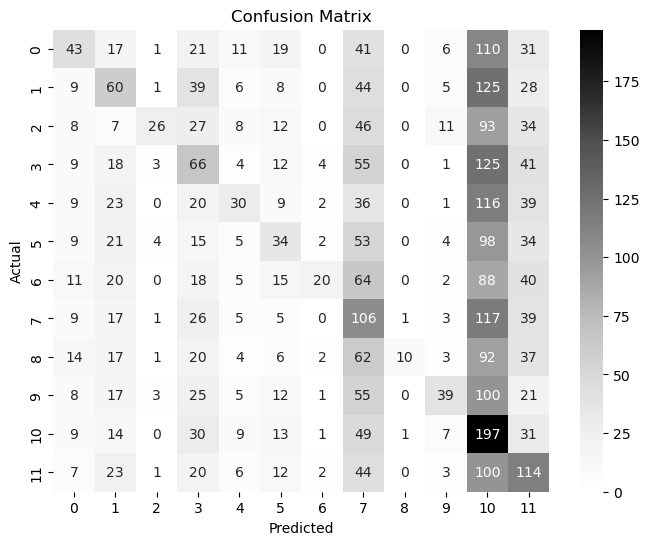

In [211]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a heatmap of the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greys")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\asuri\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


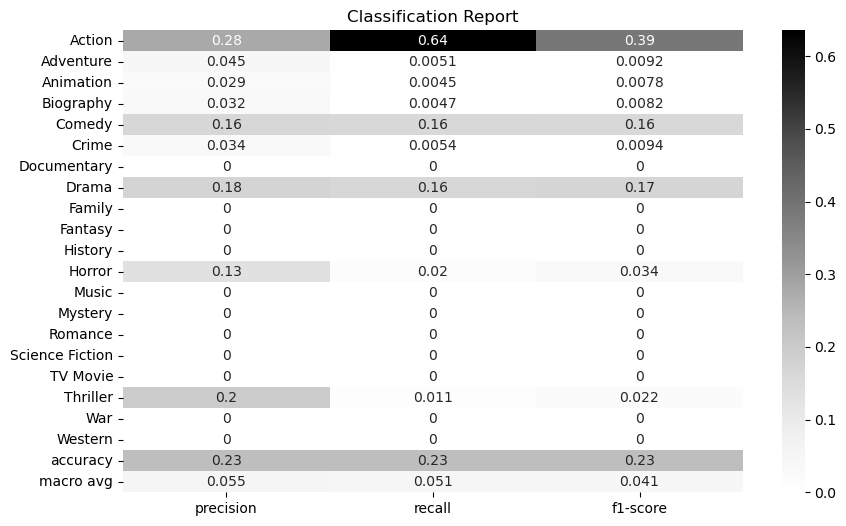

In [212]:
#pip install matplotlib seaborn
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize the classification report
report_dict = classification_report(y_test, y_pred, output_dict=True)
report_df = pd.DataFrame(report_dict).T
plt.figure(figsize=(10, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap="Greys")
plt.title("Classification Report")
plt.show()

In [213]:
df1

,words_movies,genre
0,diabolical pirate sea steals secret formula ne...,Animation
1,navigates vapid terrain close circle friends t...,Comedy
2,Devoted lifeguard butts heads brash new recrui...,Action
3,mute bartender goes city gangsters effort find...,Mystery
4,newlywed couple finds lake country honeymoon d...,Drama
...,...,...
19995,small town menfolk live fear evil spirit named...,Comedy
19996,video artist looking work drives remote house ...,Crime
19997,served refuses kill people becomes first man A...,Biography
19998,creator virtual reality called dies makes post...,Action


In [184]:
df2

,words_movies,month
0,diabolical pirate sea steals secret formula ne...,February
1,navigates vapid terrain close circle friends t...,July
2,Devoted lifeguard butts heads brash new recrui...,May
3,mute bartender goes city gangsters effort find...,February
4,newlywed couple finds lake country honeymoon d...,September
...,...,...
19995,small town menfolk live fear evil spirit named...,August
19996,video artist looking work drives remote house ...,October
19997,served refuses kill people becomes first man A...,November
19998,creator virtual reality called dies makes post...,March


df3

In [185]:
df3

,words_news,month
0,Vaccines great triumph human intellect ancient...,February
1,new book Go infused religious life Christian m...,July
2,Happy,May
3,As long made ’m good said,February
5,have idea guy gon do cover reads,January
...,...,...
19995,said cooperating inspectors limiting stockpile...,August
19996,know thinking orange so expected fall florals ...,October
19997,Agreed,November
19998,cellmate,March


In [186]:
df4

,words_news,genre
0,Vaccines great triumph human intellect ancient...,Animation
1,new book Go infused religious life Christian m...,Comedy
2,Happy,Action
3,As long made ’m good said,Mystery
5,have idea guy gon do cover reads,Horror
...,...,...
19995,said cooperating inspectors limiting stockpile...,Comedy
19996,know thinking orange so expected fall florals ...,Crime
19997,Agreed,Biography
19998,cellmate,Action
